# Clusterização - Projeto Final - Matemática Computacional

Alunos:

* Leonardo Soares da Costa Tanaka

* Lincoln Rodrigues Proença

## 1. O que é clusterização?

A clusterização, também conhecida como análise de agrupamento, é uma técnica de aprendizado de máquina que envolve a divisão de um conjunto de dados em grupos ou clusters com base em suas características e similaridades. O objetivo da clusterização é encontrar padrões intrínsecos nos dados, agrupando objetos que são mais semelhantes entre si do que com os objetos de outros clusters. Essa técnica é amplamente utilizada em diversas áreas, como mineração de dados, reconhecimento de padrões, segmentação de clientes, análise de redes sociais e muitas outras. A clusterização pode ser aplicada a uma variedade de tipos de dados, desde dados numéricos até dados textuais ou de imagem. Ela é uma ferramenta poderosa para explorar grandes conjuntos de dados e obter insights valiosos a partir deles.

### 1.1. K-Means com otimização de descida de gradiente

O K-means é um algoritmo de clusterização amplamente utilizado que agrupa dados em K clusters. Ele é baseado na minimização da soma dos quadrados das distâncias entre os pontos de dados e seus respectivos centros de cluster. O objetivo é encontrar a configuração ideal dos centroides que minimiza essa função de custo.

A otimização por descida de gradiente, por outro lado, é uma técnica utilizada para encontrar o mínimo de uma função. Ela envolve a atualização iterativa dos parâmetros do modelo em direção ao gradiente negativo da função de custo, até que se alcance um mínimo local ou global.

Portanto, a combinação do K-means com otimização de descida de gradiente refere-se a uma abordagem que busca otimizar o processo de clusterização do K-means usando técnicas de otimização por descida de gradiente. Isso pode ser feito através da adaptação do algoritmo K-means para utilizar a descida de gradiente para atualizar os centroides dos clusters, em vez de usar a fórmula convencional de atribuição e atualização dos centroides.

Essa abordagem pode ser útil em casos onde o número de clusters não é conhecido antecipadamente ou quando se deseja obter uma solução mais precisa. A otimização de descida de gradiente pode ajudar a melhorar a convergência do algoritmo K-means e a encontrar uma configuração de centroides que minimize a função de custo de forma mais eficiente. No entanto, é importante mencionar que a aplicação do K-means com otimização de descida de gradiente pode ser computacionalmente mais intensiva do que o K-means tradicional.

### 1.2. Self-Organizing Maps (SOM)

Self-Organizing Maps (SOM), também conhecidos como Mapas Auto-Organizáveis ou Redes de Kohonen, são uma técnica de aprendizado não supervisionado utilizada para visualização e organização de dados multidimensionais. Essa técnica foi proposta por Teuvo Kohonen em 1982.

O SOM é baseado em uma estrutura de neurônios artificiais organizados em uma grade bidimensional. Cada neurônio representa um protótipo ou um centro de cluster. Durante o treinamento do SOM, esses neurônios são ajustados de forma que eles se especializem em responder a certos padrões ou características dos dados de entrada.

O processo de treinamento do SOM envolve a apresentação iterativa dos dados ao mapa, onde cada neurônio é atualizado com base na sua proximidade com o dado de entrada. Inicialmente, os pesos dos neurônios são inicializados aleatoriamente. Durante o treinamento, o neurônio que é mais próximo do dado de entrada é selecionado como o vencedor ou neurônio vencedor. Os neurônios vizinhos ao neurônio vencedor também são atualizados, de acordo com uma função de vizinhança, de modo a se aproximarem do dado de entrada.

Essa atualização iterativa dos neurônios leva à formação de regiões no mapa onde neurônios similares são agrupados juntos. Portanto, o SOM mapeia as características dos dados em uma representação bidimensional, permitindo a visualização e análise dessas características em um espaço de menor dimensionalidade.

## 2. Importando as bibliotecas e as funções utilizadas no projeto

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import MiniBatchKMeans
from sklearn import metrics

sns.set_theme(style="ticks")

## 3. Criando versão nativa do Mini Batch K-Means

#### Função custo

$$
J(w) = \sum_{i=1}^{N} \underset{k}{min}\frac{1}{2}(x_i - w_k)^2
$$

#### Atualização do centro do cluster com otimização de descida de gradiente

$$
\delta w_k = -\gamma_t \frac{\partial J(x_i , w)}{\partial w} = \sum_{i=1}^{N} \begin{cases}
         \gamma_t(x_i - w_k) & se \;\; k=s(x_i,w) \\
         0 & caso \;\; contrário
       \end{cases}
$$

#### Algoritmo do Mini-Batch K-Means

1. **Entrada**: $X \in \Re^{d,N}$, número de clusters K, tamanho do batch M, número máximo de iterações T.

2. Inicialize os centróides $w_1, w_2, ..., w_k \in \Re^d$ aleatoriamente.

4. **for i=1 to T do**:

    1. $X_m \leftarrow$ aleatoriamente pega M amostras de X.
    
    5. **for $x \in X_m$ do**
    
        $d[x] \leftarrow J(K,x)$ $ \qquad \triangleright$ encontra o centroide do mais proximo de x
    
    6. **end for**

    7. **for $x \in X_m$ do**

        $k \leftarrow d[x]$

        $n_{k^*} \leftarrow n_k + 1$

        $\gamma \leftarrow \frac{1}{n_{k^*}}$

        $w_{k^*} \leftarrow w_{k} + \gamma ( x_i - w_k )$

    8. **end for** 

9. **end for**

8. **Saída**: Os centróides finais dos clusters após a convergência.

In [3]:
class MiniBatchKMeansNative:
    def __init__(self, n_clusters, max_iter=100, batch_size=100, learning_rate=0.01, initial_clusters=None):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.initial_clusters = initial_clusters

    def initialize_centroids(self, X):
        # Inicializa os centróides com base nos dados de entrada X
        if self.initial_clusters is not None:
            # Se os centróides iniciais forem fornecidos, retorna-os
            return self.initial_clusters, np.zeros(self.n_clusters, dtype=int)
        else:
            # Caso contrário, seleciona aleatoriamente índices para inicializar os centróides
            indices = np.random.choice(X.shape[0], size=self.n_clusters, replace=False)
            clusterCounts = np.zeros(self.n_clusters, dtype=int)
            return X[indices], clusterCounts

    def find_closest_centroids(self, X, centroids):
        # Calcula as distâncias entre os pontos de dados X e os centróides
        distances = np.zeros((self.n_clusters, X.shape[0]))
        for i in range(self.n_clusters):
            distances[i] = self.compute_distance(X, centroids[i])
        # Retorna os índices dos centróides mais próximos para cada ponto de dados
        return np.argmin(distances, axis=0)

    def compute_distance(self, X, centroid):
        # Calcula a distância Euclidiana entre os pontos de dados X e um centróide específico
        return np.linalg.norm(X - centroid, axis=1)

    def update_centroids(self, XM, XM_indices, d, centroids, clusterCounts):
        # Atualiza os centróides com base nos pontos de dados selecionados aleatoriamente (mini-batch)
        for i in range(len(XM)):
            clusterCounts[d[i]] += 1
            learningRate = 1 / clusterCounts[d[i]]
            # Atualiza o centróide ponderado com o ponto de dados selecionado
            centroids[d[i]] = centroids[d[i]] + learningRate * (XM[i] - centroids[d[i]])

    def select_random_samples(self, X):
        # Seleciona aleatoriamente um subconjunto de pontos de dados com base no tamanho do mini-batch
        indices = np.random.choice(X.shape[0], size=self.batch_size, replace=False)
        random_samples = X[indices]
        # Retorna os índices selecionados e os pontos de dados correspondentes
        return indices, random_samples

    def fit(self, X):
        # Inicializa os centróides e contadores de cluster
        centroids, clusterCounts = self.initialize_centroids(X)
        n_samples = X.shape[0]

        if self.batch_size > n_samples:
            self.batch_size = n_samples

        # Executa o algoritmo de treinamento por um número máximo de iterações
        for _ in range(self.max_iter):
            # Seleciona um mini-batch aleatório de pontos de dados
            XM_indices, XM = self.select_random_samples(X)
            # Encontra os centróides mais próximos para o mini-batch selecionado
            d = self.find_closest_centroids(XM, centroids)
            # Atualiza os centróides com base no mini-batch selecionado
            self.update_centroids(XM, XM_indices, d, centroids, clusterCounts)

        # Armazena os centróides finais obtidos após o treinamento
        self.centroids = centroids

    def predict(self, X):
        # Encontra os centróides mais próximos para cada ponto de dados X
        return self.find_closest_centroids(X, self.centroids)

### 3.1. Funções para analisar as métricas e a diferença dos gráficos

In [6]:
import random

def generate_points(n, x_min, x_max, y_min, y_max):
    # Gera pontos aleatórios dentro de um intervalo específico
    points = []
    for _ in range(n):
        x = random.uniform(x_min, x_max)
        y = random.uniform(y_min, y_max)
        point = (x, y)
        points.append(point)
    return points

def plot_clustering(tabela, n):
    # Lê os dados do arquivo CSV especificado
    df = pd.read_csv(f"./data/exercises/{tabela}.csv")
    
    # Gera centróides aleatórios para o número de clusters especificado
    centroids = np.array(generate_points(n, df["x"].min(), df["x"].max(), df["y"].min(), df["y"].max()))
    
    # Cria instâncias dos algoritmos MiniBatchKMeans do scikit-learn e MiniBatchKMeansNative personalizado
    clustering1 = MiniBatchKMeans(n_clusters=n, init=centroids)
    clustering2 = MiniBatchKMeansNative(n_clusters=n, initial_clusters=centroids)

    i=0
    for clustering in [clustering1, clustering2]:
        i+=1
        # Executa o algoritmo de clustering para os dados de entrada
        clustering.fit(df[["x", "y"]].to_numpy())
        # Atribui rótulos de cluster aos dados de entrada
        labels = clustering.predict(df[["x", "y"]].to_numpy())
        # Adiciona os rótulos de cluster aos dados do DataFrame
        df[f'cluster{i}'] = labels

    # Calcula e imprime as métricas de avaliação de clustering
    print("Silhouette:")
    print("Color:", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["color"], metric="euclidean"))
    print("Cluster Sklearn:", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["cluster1"], metric="euclidean"))
    print("Cluster nativo", metrics.silhouette_score(df[["x", "y"]].to_numpy(), df["cluster2"], metric="euclidean"))
    print("Davies-Bouldin:")
    print("Color:", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["color"]))
    print("Cluster Sklearn:", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["cluster1"]))
    print("Cluster nativo", metrics.davies_bouldin_score(df[["x", "y"]].to_numpy(), df["cluster2"]))
    print("Calinski-Harabasz:")
    print("Color:", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["color"]))
    print("Cluster Sklearn:", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["cluster1"]))
    print("Cluster nativo", metrics.calinski_harabasz_score(df[["x", "y"]].to_numpy(), df["cluster2"]))

    # Plota os gráficos de dispersão dos dados com os rótulos de cluster
    fig, ax = plt.subplots(1, 3, figsize=(25,10))
    sns.scatterplot(data=df, x='x', y='y', hue='color', ax=ax[0])
    ax[0].set_title('Color')
    sns.scatterplot(data=df, x='x', y='y', hue='cluster1', ax=ax[1])
    ax[1].set_title('Cluster Sklearn')
    sns.scatterplot(data=df, x='x', y='y', hue='cluster2', ax=ax[2])
    ax[2].set_title('Cluster nativo')

    plt.tight_layout()
    plt.show()

### 3.2. Análise dos modelos: Clustering Exercises

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5359024598964252
Cluster Sklearn: 0.5338694878769441
Cluster nativo 0.5187895643303576
Davies-Bouldin:
Color: 0.7230213812256592
Cluster Sklearn: 0.7120028291003853
Cluster nativo 0.7312776993800003
Calinski-Harabasz:
Color: 15233.532707986338
Cluster Sklearn: 15794.70413915961
Cluster nativo 15282.589148992116


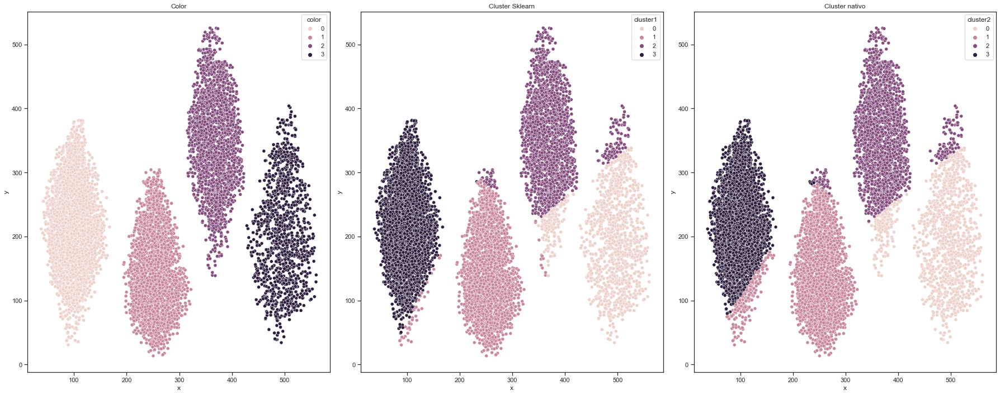

In [7]:
plot_clustering("basic1", 4)

Os resultados dos clusters foram bem similares, porém com algumas faixas de diferença de pontos de diferença. Além disso, as métricas estão bem similares e não divergiram tanto da classificação de referência.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.4670415948654753
Cluster Sklearn: 0.46715619969851574
Cluster nativo 0.46723821546784355
Davies-Bouldin:
Color: 0.8630050420407448
Cluster Sklearn: 0.865218149460028
Cluster nativo 0.8651045651062019
Calinski-Harabasz:
Color: 16988.284003171135
Cluster Sklearn: 17017.032378283962
Cluster nativo 17018.998308800048


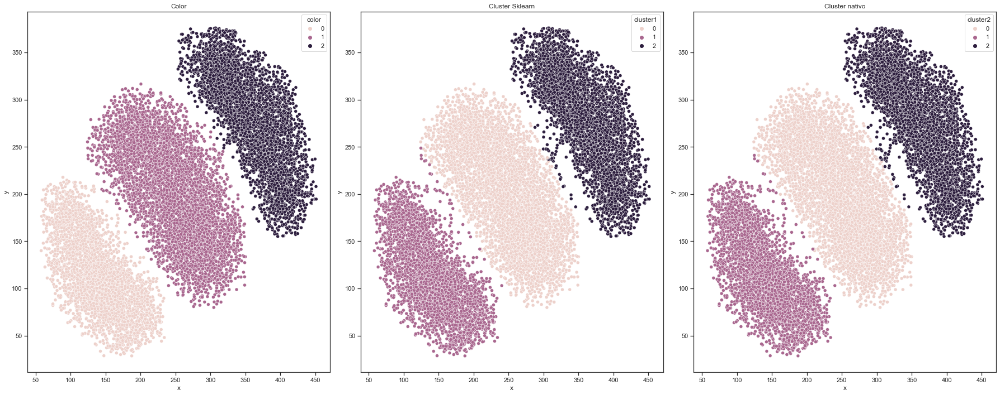

In [8]:
plot_clustering("basic4", 3)

Os resultados foram muito parecidos com apenas alguns pontos de diferença, por isso as métricas também ficaram próximas. Além disso, ficou bem parecido com a classificação de referência.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.7086648772316748
Cluster Sklearn: 0.7087884928168264
Cluster nativo 0.7087584627332831
Davies-Bouldin:
Color: 0.4086946803848604
Cluster Sklearn: 0.4084454585847071
Cluster nativo 0.40839222229173133
Calinski-Harabasz:
Color: 14881.511905685964
Cluster Sklearn: 14887.602092417328
Cluster nativo 14884.236544147288


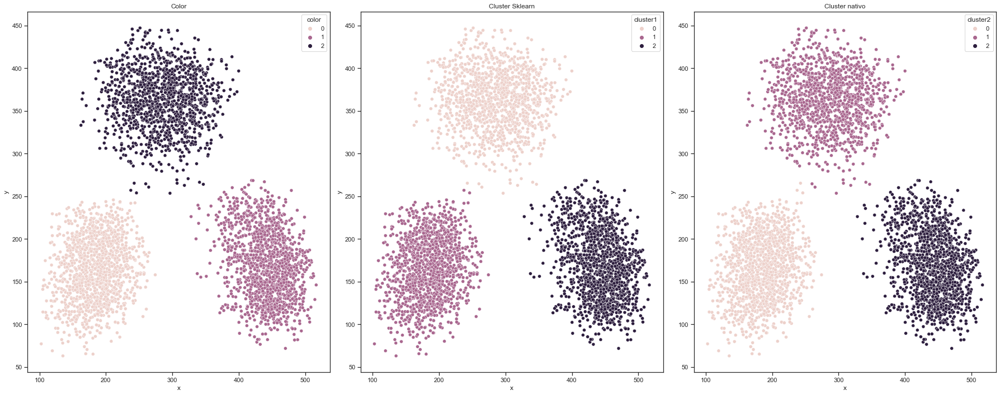

In [9]:
plot_clustering("basic5", 3)

Os resultados foram parecidos com poucos pontos de diferença, porém o cluster 0 e 1 foram trocados de lugar. Assim muito provavelmente os centroides iniciais desses dois eram bem próximos e acabaram trocando de lugar ao aplicar as duas funções.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.45470941484633426
Cluster Sklearn: 0.47071469643471786
Cluster nativo 0.47131825595875304
Davies-Bouldin:
Color: 0.7086736130303429
Cluster Sklearn: 0.6871241528885091
Cluster nativo 0.6869405426329158
Calinski-Harabasz:
Color: 4817.328036051302
Cluster Sklearn: 5065.688701661028
Cluster nativo 5075.204384987269


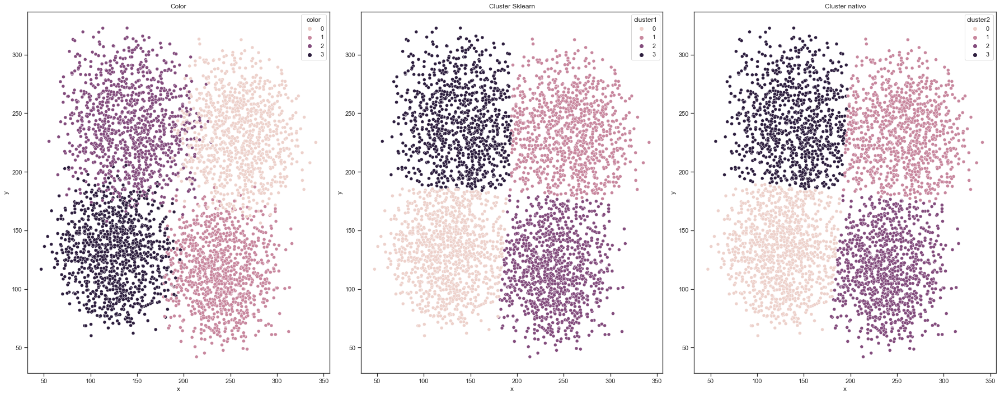

In [10]:
plot_clustering("blob", 4)

Os resultados foram muito parecidos com apenas alguns pontos de diferença, por isso as métricas também ficaram próximas. Além disso, ficou bem parecido com a classificação de referência.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.6465156552400856
Cluster Sklearn: 0.538685598734449
Cluster nativo 0.5087160641780004
Davies-Bouldin:
Color: 0.4400533543148162
Cluster Sklearn: 0.6772899758519488
Cluster nativo 0.7115848029844434
Calinski-Harabasz:
Color: 28284.642443328754
Cluster Sklearn: 13796.530227229608
Cluster nativo 11550.44856638018


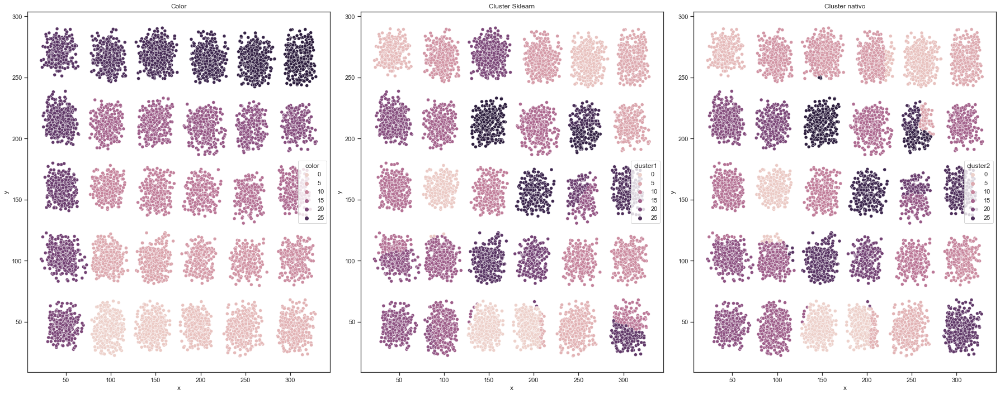

In [11]:
plot_clustering("boxes", 30)

Os resultados foram próximos de certa forma com algumas diferenças entre os clusters. Além disso, a clusterização do scikit-learn teve um melhor desempenho em relação à clusterização feita por nós ao ser avaliado as métricas.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5374000827879934
Cluster Sklearn: 0.42372944271079616
Cluster nativo 0.425563060048325
Davies-Bouldin:
Color: 0.5940890223863998
Cluster Sklearn: 0.8528656632351433
Cluster nativo 0.8849404818433652
Calinski-Harabasz:
Color: 34966.028200262444
Cluster Sklearn: 23385.672862702966
Cluster nativo 23646.545031488655


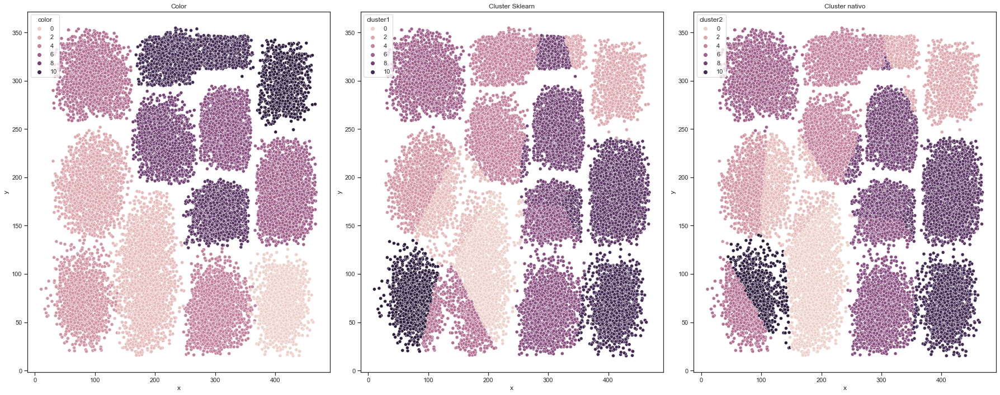

In [12]:
plot_clustering("boxes3", 12)

Os resultados dos clusters foram bem similares, porém com algumas faixas de diferença de pontos de diferença. Além disso, as métricas estão bem similares e divergiram da classificação de referência.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.7114309961278191
Cluster Sklearn: 0.537767215850393
Cluster nativo 0.7126034598377666
Davies-Bouldin:
Color: 0.37575387992543824
Cluster Sklearn: 0.738395576624759
Cluster nativo 0.37231781163318534
Calinski-Harabasz:
Color: 9692.778785946037
Cluster Sklearn: 4063.3243008767745
Cluster nativo 9787.49794235303


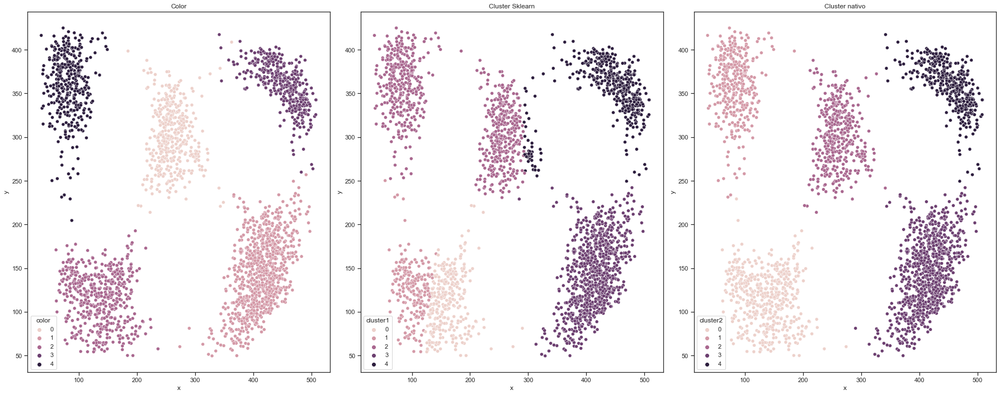

In [13]:
plot_clustering("network", 5)

Os resultados das duas clusterizações foram bem diferentes com a feita por nós tendo um desempenho melhor e com maior proximidade com a classificação de referência.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.6128255623301866
Cluster Sklearn: 0.6128255623301866
Cluster nativo 0.6128255623301866
Davies-Bouldin:
Color: 0.5436091676015103
Cluster Sklearn: 0.5436091676015103
Cluster nativo 0.5436091676015103
Calinski-Harabasz:
Color: 945.686103172692
Cluster Sklearn: 945.6861031726921
Cluster nativo 945.6861031726921


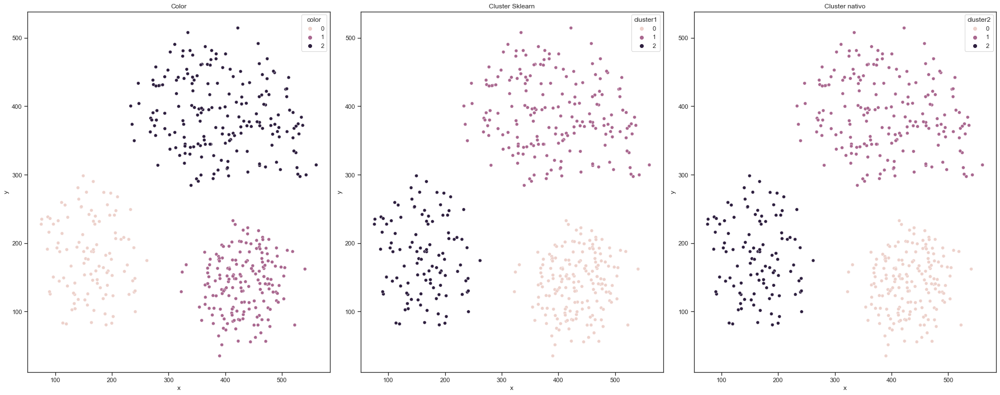

In [14]:
plot_clustering("sparse", 3)

Os resultados foram iguais entre as clusterizações pelo fato do dataset ser mais espaçado.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.5193736396508104
Cluster Sklearn: 0.5109090087253997
Cluster nativo 0.4975295387676067
Davies-Bouldin:
Color: 0.7315914236355435
Cluster Sklearn: 0.7423931311180945
Cluster nativo 0.7784405929347965
Calinski-Harabasz:
Color: 3122.3724301315324
Cluster Sklearn: 3191.3660009753494
Cluster nativo 3043.21861194212


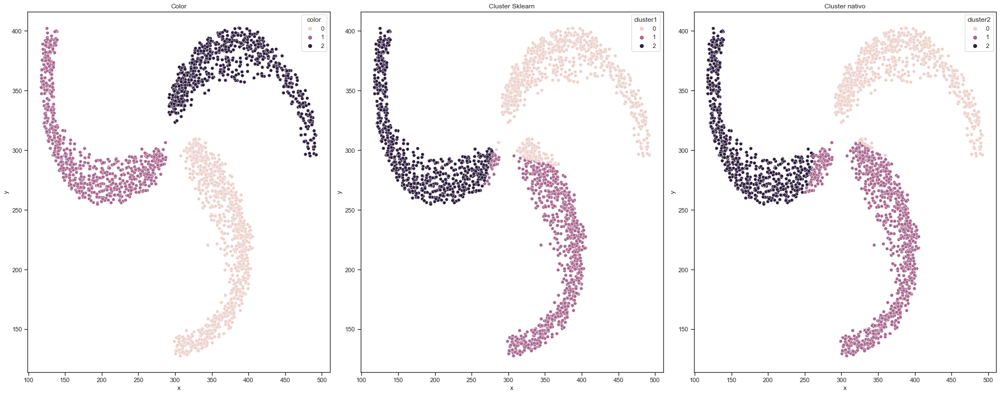

In [15]:
plot_clustering("spirals", 3)

Os resultados dos clusters foram bem similares, porém com algumas faixas de diferença de pontos de diferença. Além disso, as métricas estão bem similares e não divergiram tanto da classificação de referência.

c:\Users\linco\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1745: RuntimeWarning: Explicit initial center position passed: performing only one init in MiniBatchKMeans instead of n_init=3.
  super()._check_params(X)


Silhouette:
Color: 0.4445730060107293
Cluster Sklearn: 0.4370044239020148
Cluster nativo 0.4406748958603287
Davies-Bouldin:
Color: 0.776418796483771
Cluster Sklearn: 0.7734229697478078
Cluster nativo 0.7864098746343815
Calinski-Harabasz:
Color: 10581.341427150237
Cluster Sklearn: 10358.131447514432
Cluster nativo 10505.311911838462


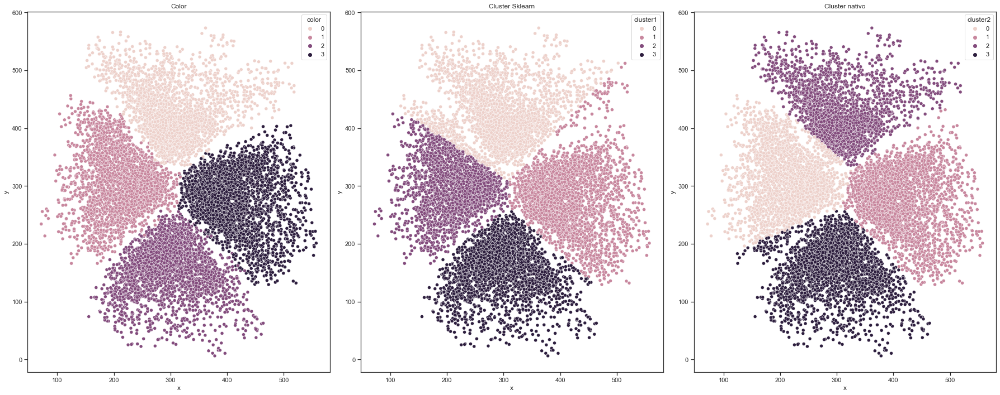

In [16]:
plot_clustering("supernova", 4)

Os resultados dos clusters foram bem similares, porém com algumas faixas de diferença de pontos de diferença. Além disso, as métricas estão bem similares e não divergiram tanto da classificação de referência.

## 4. Criando versão nativa do Self-Organizing Maps (SOM)

In [1]:
from minisom import MiniSom

(64, 64, 3)

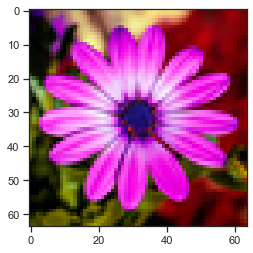

In [200]:
img = plt.imread('./data/img/flor1.png')
plt.imshow(img)
img.shape

In [201]:
pixels = np.reshape(img, (img.shape[0]*img.shape[1], 3))
pixels.shape

(4096, 3)

In [93]:
som2 = MiniSom(x= 4, y = 4, input_len = 3, sigma=0.1, learning_rate=0.2)

In [100]:
som2.random_weights_init(pixels)
starting_weights = som2.get_weights().copy()
som2.train_random(pixels, 100)
qnt = som2.quantization(pixels)
clustered = np.zeros(img.shape)

for i, q in enumerate(qnt):
  clustered[np.unravel_index(i, (img.shape[0], img.shape[1]))] = q

In [101]:
som2.get_weights().shape

(4, 4, 3)

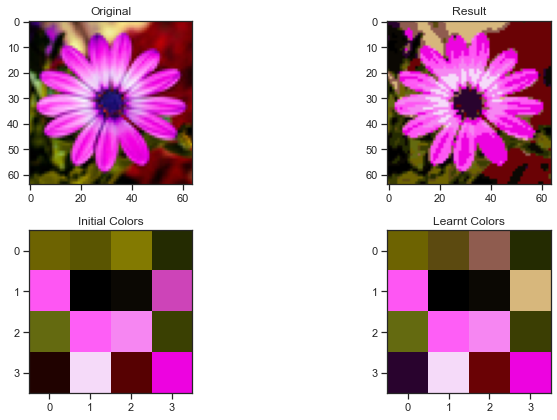

In [102]:
plt.figure(figsize=(12, 6))
plt.subplot(221)
plt.title('Original')
plt.imshow(img)
plt.subplot(222)
plt.title('Result')
plt.imshow(clustered)
plt.subplot(223)
plt.title('Initial Colors')
plt.imshow(starting_weights)
plt.subplot(224)
plt.title('Learnt Colors')
plt.imshow(som2.get_weights())
plt.tight_layout()
plt.show()

In [202]:
class SOM:
    def __init__(self,input_shape, output_shape, num_iterations, initial_learning_rate, initial_radius):
        self.input_shape = input_shape
        self.output_shape = output_shape
        self.num_iterations = num_iterations
        self.initial_learning_rate = initial_learning_rate
        self.initial_radius = initial_radius
        self.weights = np.random.randn(output_shape[0], output_shape[1], input_shape[0])
        # Inicializa os pesos aleatoriamente com base nas dimensões de entrada e saída

    def find_best_matching_unit(self, input_vector):
        min_dist = np.inf
        bmu = (0, 0)

        for i in range(self.weights.shape[0]):
            for j in range(self.weights.shape[1]):
                # Calcula a distância Euclidiana entre o vetor de entrada e cada neurônio
                dist = np.linalg.norm(input_vector - self.weights[i, j])
                if dist < min_dist:
                    min_dist = dist
                    bmu = (i, j)
                    # Atualiza o melhor neurônio correspondente (Best Matching Unit)

        return bmu

    def update_weights(self, input_vector, bmu, learning_rate, radius):
        for i in range(self.weights.shape[0]):
            for j in range(self.weights.shape[1]):
                # Calcula a distância entre o neurônio atual e o BMU (Best Matching Unit)
                dist = np.linalg.norm(np.array(bmu) - np.array([i, j]))
                if dist <= radius:
                    # Atualiza os pesos dos neurônios dentro do raio de vizinhança
                    influence = np.exp(-dist / (2 * radius))
                    self.weights[i, j] += learning_rate * influence * (input_vector - self.weights[i, j])
                    # Atualiza os pesos com base na taxa de aprendizado, na influência e na diferença entre o vetor de entrada e os pesos atuais

    def train(self, data):
        for iteration in range(self.num_iterations):
            learning_rate = self.initial_learning_rate * (1 - iteration / self.num_iterations)
            radius = self.initial_radius * (1 - iteration / self.num_iterations)
            # Calcula a taxa de aprendizado e o raio de vizinhança para a iteração atual

            for input_vector in data:
                bmu = self.find_best_matching_unit(input_vector)
                self.update_weights(input_vector, bmu, learning_rate, radius)
                # Encontra o BMU e atualiza os pesos para cada vetor de entrada

    def quantize(self, data):
        quantized_data = np.zeros(data.shape)

        for i, input_vector in enumerate(data):
            bmu = self.find_best_matching_unit(input_vector)
            quantized_data[i] = self.weights[bmu]
            # Mapeia cada vetor de entrada para o neurônio correspondente (BMU) e retorna os pesos associados

        return quantized_data
    
    def get_palette(self):
        return self.weights
        # Retorna os pesos da rede neural como uma paleta de cores

In [203]:
# Obtendo os pixels da imagem como vetor de entrada
input_data = img.reshape(-1, 3)

# Definindo a forma da entrada e da saída do SOM
input_shape = input_data.shape[1:]
output_shape = (4, 4)  # Paleta de 16 cores (4x4)

# Criando e treinando o SOM
som = SOM(input_shape,output_shape,initial_learning_rate=0.1, initial_radius=2, num_iterations=100)
starting_weights = som.get_palette()

In [204]:
som.train(input_data)

In [205]:
# Obtendo a paleta de cores resultante
palette = som.get_palette()

In [206]:
mapped = som.quantize(pixels)
mapped = mapped.reshape(img.shape)

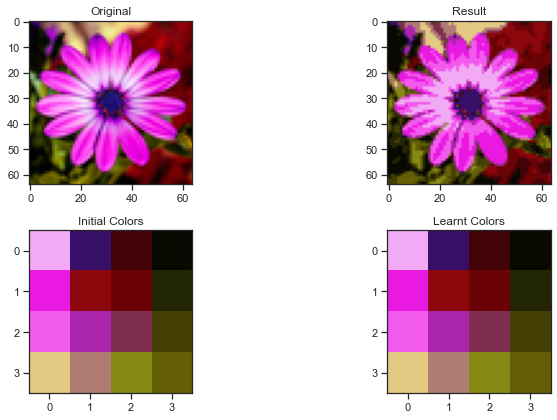

In [207]:
plt.figure(figsize=(12, 6))
plt.subplot(221)
plt.title('Original')
plt.imshow(img)
plt.subplot(222)
plt.title('Result')
plt.imshow(mapped)
plt.subplot(223)
plt.title('Initial Colors')
plt.imshow(starting_weights)
plt.subplot(224)
plt.title('Learnt Colors')
plt.imshow(palette)
plt.tight_layout()
plt.show()

## 5. Conclusão

Neste trabalho, implementamos e testamos duas técnicas de clusterização: o algoritmo K-means com descida de gradiente e o modelo de mapas auto-organizáveis (Self-Organizing Maps - SOM). Ambas as abordagens são amplamente utilizadas na área de aprendizado de máquina não supervisionado para agrupar dados sem rótulos em grupos distintos.

No algoritmo K-means com descida de gradiente, utilizamos a ideia fundamental de minimizar a função objetivo iterativamente. Através da atualização dos centróides dos clusters e da atribuição dos pontos de dados aos clusters mais próximos, obtivemos clusters finais que representam regiões de dados similares. Implementamos a técnica de mini-batch K-means, que utiliza um subconjunto aleatório dos dados em cada iteração para melhorar a eficiência do algoritmo em grandes conjuntos de dados.

Por outro lado, implementamos o modelo de mapas auto-organizáveis (SOM), que é inspirado no funcionamento do cérebro humano. O SOM consiste em uma grade bidimensional de neurônios, onde cada neurônio possui um vetor de pesos associado. Durante o treinamento, os neurônios competem para representar os dados de entrada, e os pesos são atualizados de acordo com a distância entre os neurônios e o vetor de entrada. Ao final do treinamento, os neurônios formam um mapa topologicamente organizado que preserva a estrutura dos dados de entrada.

Realizamos experimentos comparativos utilizando conjuntos de dados de teste. Avaliamos a qualidade dos clusters gerados pelas duas abordagens utilizando métricas de avaliação, como a silhueta, o índice de Davies-Bouldin e o índice de Calinski-Harabasz. Também visualizamos os resultados por meio de gráficos de dispersão, onde os pontos de dados foram coloridos de acordo com seus clusters.

Com base nos resultados, observamos que ambas as técnicas de clusterização foram capazes de agrupar os dados de forma significativa. O K-means com descida de gradiente mostrou-se eficaz em encontrar clusters bem definidos, especialmente quando utilizado com mini-batches em grandes conjuntos de dados. Por outro lado, o SOM demonstrou a capacidade de preservar a topologia dos dados, formando um mapa auto-organizado que pode ser útil para visualização e detecção de padrões.

Em resumo, este trabalho nos permitiu compreender e implementar duas importantes técnicas de clusterização, o K-means com descida de gradiente e os mapas auto-organizáveis (SOM). Ambas as abordagens têm seus pontos fortes e podem ser aplicadas em diferentes cenários de análise de dados não supervisionada. A escolha entre elas dependerá das características do conjunto de dados e dos objetivos específicos do projeto.